In [1]:
# This notebook plots a time series and checks what kind of periodic signals are in the time series
# the input data are unevenly spaced over time
#
#
# https://docs.astropy.org/en/stable/timeseries/lombscargle.html

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


from astropy.timeseries import LombScargle
import plotly.graph_objects as go
from scipy.signal import chirp, find_peaks, peak_widths

In [3]:
# load data
A = pd.read_csv('periodicity.csv.gz', index_col='EPOCH', parse_dates=['EPOCH'])
#A['MJD'] = A.index.to_julian_date() - JD0
A.shape


(140004, 1)

In [4]:
A.head()

,VALUE
EPOCH,
2017-01-01 01:00:00,-0.207594
2017-01-01 01:10:00,-0.197786
2017-01-01 01:20:00,-0.189524
2017-01-01 01:30:00,-0.183234
2017-01-01 01:40:00,-0.179289


### data spacing

In [5]:
# 10-min theoretically but samples are missing thus uneven spaced over time
A.reset_index('EPOCH')['EPOCH'].diff().value_counts()

0 days 00:10:00    125443
0 days 01:10:00      3501
0 days 00:20:00      3080
0 days 00:30:00      1851
0 days 01:00:00      1604
0 days 00:50:00      1446
0 days 00:40:00      1414
0 days 01:20:00       808
0 days 03:00:00       251
0 days 02:50:00       115
0 days 01:30:00       104
0 days 01:40:00        75
0 days 01:50:00        66
0 days 02:00:00        62
0 days 02:20:00        53
0 days 02:10:00        42
0 days 02:30:00        37
0 days 02:40:00        32
0 days 03:10:00         4
0 days 04:30:00         2
0 days 03:30:00         2
0 days 05:20:00         2
0 days 03:40:00         2
0 days 04:10:00         1
0 days 04:20:00         1
0 days 04:50:00         1
0 days 05:50:00         1
0 days 04:00:00         1
1 days 01:00:00         1
4 days 21:40:00         1
Name: EPOCH, dtype: int64

In [6]:
# spacing range
A.reset_index('EPOCH')['EPOCH'].diff().value_counts().sort_index()

0 days 00:10:00    125443
0 days 00:20:00      3080
0 days 00:30:00      1851
0 days 00:40:00      1414
0 days 00:50:00      1446
0 days 01:00:00      1604
0 days 01:10:00      3501
0 days 01:20:00       808
0 days 01:30:00       104
0 days 01:40:00        75
0 days 01:50:00        66
0 days 02:00:00        62
0 days 02:10:00        42
0 days 02:20:00        53
0 days 02:30:00        37
0 days 02:40:00        32
0 days 02:50:00       115
0 days 03:00:00       251
0 days 03:10:00         4
0 days 03:30:00         2
0 days 03:40:00         2
0 days 04:00:00         1
0 days 04:10:00         1
0 days 04:20:00         1
0 days 04:30:00         2
0 days 04:50:00         1
0 days 05:20:00         2
0 days 05:50:00         1
1 days 01:00:00         1
4 days 21:40:00         1
Name: EPOCH, dtype: int64

In [7]:
# the time series
TS = A.reset_index('EPOCH')['EPOCH']
# the sampling series
X = TS.diff().value_counts().sort_index()
# the length of a specific spacing
t = X.index[-9:]
print(t)
# the spacing series
X = TS.diff()
# where in the spacing series
X = X[X.isin(t)]
# corresponding in the time series
X = TS.loc[X.index]
# the end of the spacing
X

TimedeltaIndex(['0 days 04:00:00', '0 days 04:10:00', '0 days 04:20:00',
                '0 days 04:30:00', '0 days 04:50:00', '0 days 05:20:00',
                '0 days 05:50:00', '1 days 01:00:00', '4 days 21:40:00'],
               dtype='timedelta64[ns]', freq=None)


6163     2017-02-28 07:50:00
9327     2017-03-28 13:30:00
14269    2017-05-15 17:30:00
16536    2017-06-07 07:30:00
18491    2017-06-28 07:30:00
18517    2017-06-28 19:00:00
25596    2017-09-06 11:20:00
69136    2018-11-08 04:00:00
81421    2019-03-09 21:50:00
93173    2019-07-16 19:30:00
104776   2019-11-23 18:00:00
Name: EPOCH, dtype: datetime64[ns]

In [8]:
# the beginning of the spacing
TS.iloc[X.index - 1]

6162     2017-02-28 03:50:00
9326     2017-03-28 09:20:00
14268    2017-05-14 16:30:00
16535    2017-06-07 03:10:00
18490    2017-06-28 02:40:00
18516    2017-06-28 13:40:00
25595    2017-09-06 06:50:00
69135    2018-11-07 22:10:00
81420    2019-03-09 16:30:00
93172    2019-07-11 21:50:00
104775   2019-11-23 13:30:00
Name: EPOCH, dtype: datetime64[ns]

## Original data

In [9]:
sns.set(context='paper', style='ticks', font_scale=1.5)

In [10]:
A10M = A.iloc[:,0]
A10M

EPOCH
2017-01-01 01:00:00   -0.207594
2017-01-01 01:10:00   -0.197786
2017-01-01 01:20:00   -0.189524
2017-01-01 01:30:00   -0.183234
2017-01-01 01:40:00   -0.179289
                         ...   
2020-11-16 22:40:00    0.036377
2020-11-16 22:50:00    0.024597
2020-11-16 23:00:00    0.017988
2020-11-16 23:30:00    0.030087
2020-11-16 23:40:00    0.044106
Name: VALUE, Length: 140004, dtype: float64

Text(0, 0.5, 'Value [unit]')

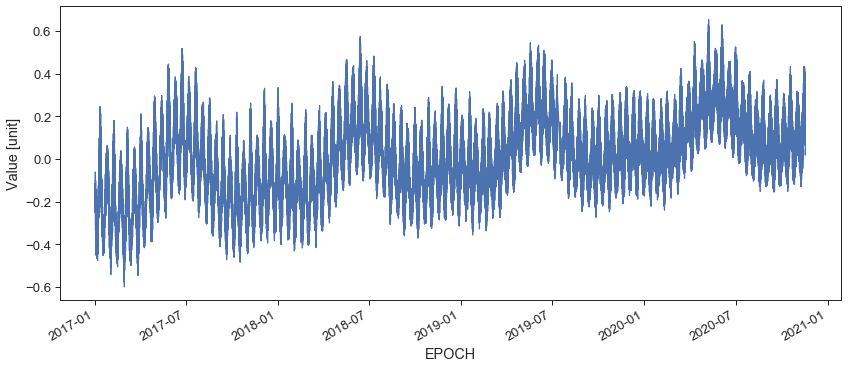

In [11]:
ax = A10M.plot(figsize=(14,6))
ax.set_ylabel('Value [unit]')

## Daily averages

In [12]:
# 01D one day average series
A01D = A.index.strftime('%Y-%m-%d')
A01D = pd.to_datetime(A01D)
A01D = A.groupby(A01D).mean()
A01D = A01D.iloc[:,0]
A01D

EPOCH
2017-01-01   -0.217408
2017-01-02   -0.307263
2017-01-03   -0.353448
2017-01-04   -0.402951
2017-01-05   -0.391529
                ...   
2020-11-12    0.158238
2020-11-13    0.228670
2020-11-14    0.262073
2020-11-15    0.242277
2020-11-16    0.218411
Name: VALUE, Length: 1412, dtype: float64

Text(0, 0.5, 'Value [unit]')

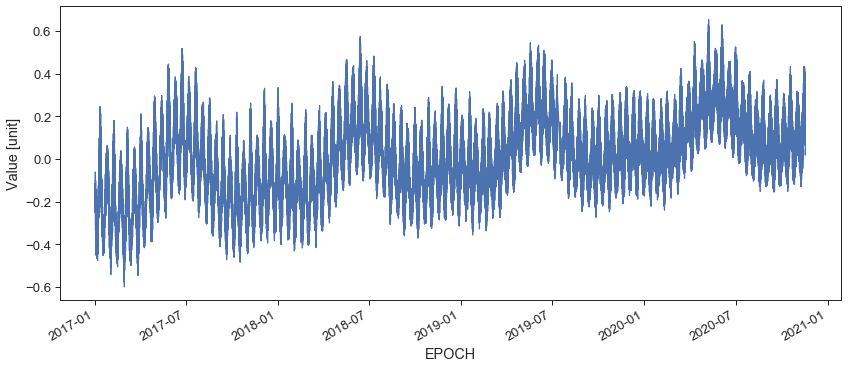

In [13]:
ax = A10M.plot(figsize=(14,6))
ax.set_ylabel('Value [unit]')

## Per-revolution averages

In [14]:
# average over the orbital periods
t0 = pd.Timestamp(A.index[0].date())

revolution_counter = 0

# nominal period
nominal_period = 14*3600 + 4*60 + 42 #seconds

# container for all orbital revolutions
X = dict()

for i, tcur in enumerate(A.index[:]):
    # initiate the window
    if (i == 0):
        tbeg = t0
        tend = tcur
        continue
    
    # how long is the window now?
    window = tcur-tbeg
    
    # have we pass the length of a nomical period?
    if (window > pd.Timedelta(nominal_period, 'seconds')):
        # orbital revolution completed
        revolution_counter += 1
        # navdata along the orbital revolution
        data = A.loc[tbeg:tend]
        # take the average value
        orbital_period = data.iloc[:,0].mean()
        
        # print(tbeg, tend, window, data.shape, window.seconds>nominal_period)
        # print('=====', revolution_counter, orbital_period)
        
        # save the orbital revolution
        X[revolution_counter] = {
            'tbeg': tbeg,
            'tend': tend,
            'samples': data.shape[0],
            'orbprd' : orbital_period,
        }
        
        # reset the start of the window
        tbeg = tcur
    
    # update the end of the window
    tend = tcur

# dataframe
X = pd.DataFrame(X).T
X

,tbeg,tend,samples,orbprd
1,2017-01-01 00:00:00,2017-01-01 14:00:00,70,-0.172123
2,2017-01-01 14:10:00,2017-01-02 04:10:00,83,-0.239381
3,2017-01-02 04:20:00,2017-01-02 15:50:00,29,-0.327484
4,2017-01-02 18:40:00,2017-01-03 07:30:00,56,-0.349092
5,2017-01-03 10:00:00,2017-01-04 00:00:00,68,-0.381467
...,...,...,...,...
2357,2020-11-13 17:00:00,2020-11-14 07:00:00,66,0.258843
2358,2020-11-14 07:10:00,2020-11-14 21:10:00,57,0.247998
2359,2020-11-14 22:00:00,2020-11-15 12:00:00,45,0.242713
2360,2020-11-15 12:10:00,2020-11-16 02:10:00,65,0.246244


In [15]:
# one revolution series
A01R = pd.Series(
    data = X['orbprd'].values, 
    index=X['tbeg'].rename('EPOCH'), 
    name='VALUE',
)
#A01R = pd.DataFrame(A01R)
A01R

EPOCH
2017-01-01 00:00:00   -0.172123
2017-01-01 14:10:00   -0.239381
2017-01-02 04:20:00   -0.327484
2017-01-02 18:40:00   -0.349092
2017-01-03 10:00:00   -0.381467
                         ...   
2020-11-13 17:00:00    0.258843
2020-11-14 07:10:00    0.247998
2020-11-14 22:00:00    0.242713
2020-11-15 12:10:00    0.246244
2020-11-16 02:20:00    0.223766
Name: VALUE, Length: 2361, dtype: object

Text(0, 0.5, 'Value [unit]')

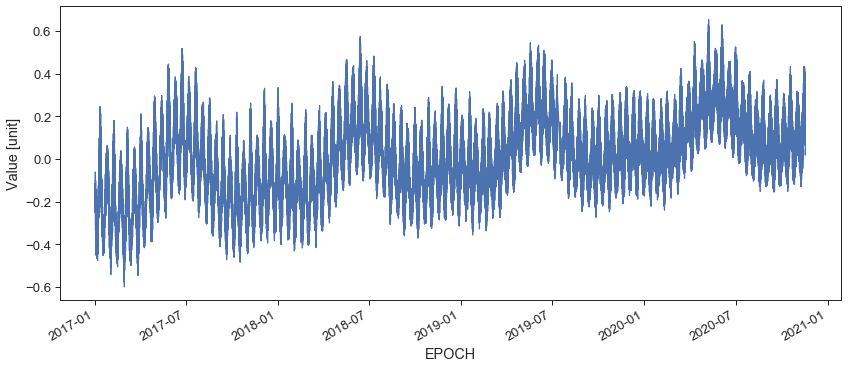

In [16]:
ax = A10M.plot(figsize=(14,6))
ax.set_ylabel('Value [unit]')

## Interactive plot

In [17]:
# interactive plot
fig = go.Figure()
X = A10M
fig.add_trace(go.Scatter(x=X.index, y=X.values, mode="lines", name='origina.'))
X = A01D
fig.add_trace(go.Scatter(x=X.index, y=X.values, mode="lines", name='daily'))
X = A01R
fig.add_trace(go.Scatter(x=X.index, y=X.values, mode="lines", name='revolution'))
# fig.write_html("sample.html")
fig

## Visual inspection

### linear trend visible

### stronger peaks/amplitudes in the summer
* 2017-06-23
* 2018-06-13
* 2019-06-03
* 2020-05-22 (although not so clear, the one before and after seem stronger)

**354 days**

### weaker peaks/amplitudes in the winter
* 2017-01-10
* 2018-01-01
* 2018-12-20
* 2017-12-11 (though Nov 26 seems stronger)

**354 days**

*Comment*: Is this related to the lunar year (354.367056 days)?



### most of the high dense peaks seem to have alternative amplitudes 
* 2017-06-23 (higher) 
* 2017-07-06 
* 2017-07-20 (higher)
* 2017-08-03
* 2017-08-17 (higher)
* ...
* 2019-06-03
* 2019-06-15
* 2019-06-30
* 2019-07-11
* 2019-07-27
* ...

**~13 days** vs **~27 days**

*Comment*: They seem to be associated to the Moon phases (new vs. full?). Moon completes one revolution around the Earth in one sidereal month that equals to 27.3 days.

In addition, 354 is a multiple of 27.3.

## Periodogram

In [18]:
JD0 = 2400000.5

In [19]:
# Lomb-Scargle periodogram, evaluated at frequencies chosen automatically based on the input data

def test_periodogram(data):
    t = data.index.to_julian_date() - JD0
    t = t.values
    y = data.values
    print(t.min(), t.max())
    print()

    ls = LombScargle(t, y)
    frequency, power = ls.autopower(nyquist_factor=5)
    print('frequency', len(frequency), frequency.min(), frequency.max())
    print()

    # let's plot
    plt.figure(figsize=(14,6))
    plt.semilogx(1/frequency, power)
    plt.xlabel('Cycle / Period / Day');
    plt.ylabel('Power');


    print('max_power: ', power.max(), 'freq: ', 1/frequency[np.argmax(power)])
    print()


### original

57754.04166666651 59169.98611111101

frequency 1750050 7.062423980852726e-05 247.19183112958646

max_power:  0.32091383329607154 freq:  0.006940907541839462



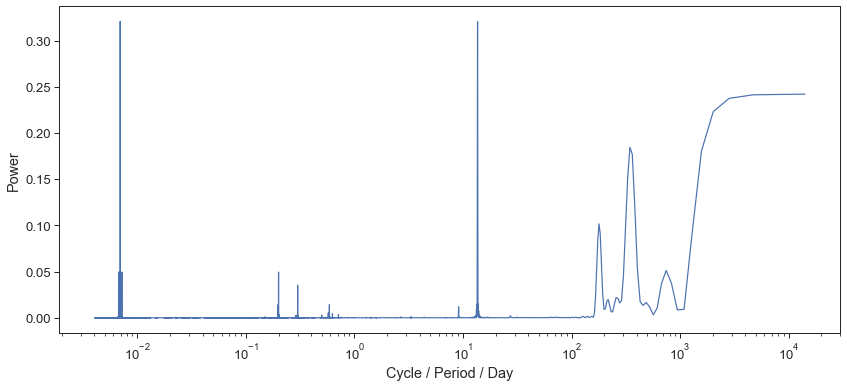

In [20]:
# original data
X = A10M
test_periodogram(X)

### Comment
Perhaps a false signal as this roughly corresponds to 10-min sampling rate

In [21]:
# # 
# d = pd.DataFrame()
# d['power'] = power
# d['period'] = 1/frequency
# d.sort_values(by='power', ascending=False)[:30].iloc[:,1].sort_values()

### daily

57754.0 59169.0

frequency 17651 7.06713780918728e-05 2.4947703180212013

max_power:  0.37127573194406727 freq:  0.4822931933603736



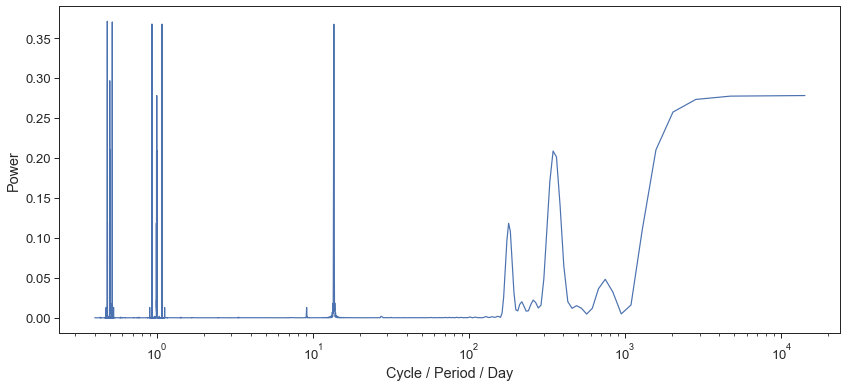

In [22]:
# daily average series
X = A01D
test_periodogram(X)

### revolution

57754.0 59169.097222222015

frequency 29513 7.066652271635295e-05 4.1710915033327325

max_power:  0.37010028786225513 freq:  13.619800021386093



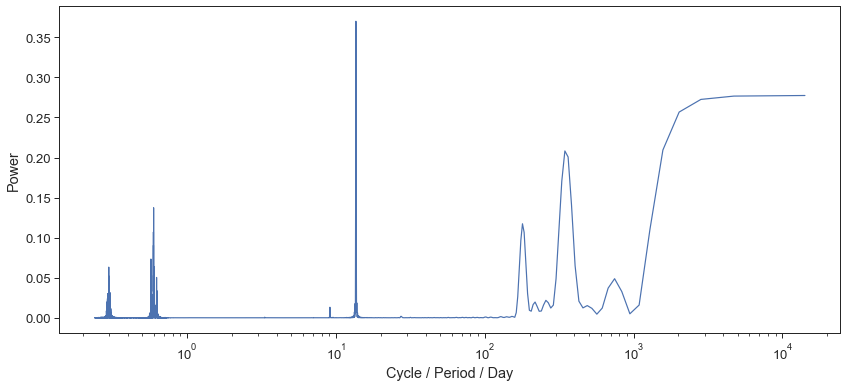

In [23]:
# revolution average series
X = A01R
test_periodogram(X)